In [14]:
import numpy as np
import pandas as pd
from sklearn.datasets import fetch_openml
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [15]:
mnist = fetch_openml('mnist_784')
X = mnist.data
y = mnist.target

In [16]:
X.shape

(70000, 784)

In [17]:
# Features
X.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [18]:
# Target
y.head()

0    5
1    0
2    4
3    1
4    9
Name: class, dtype: category
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

In [19]:
sample_data = X.sample()
sample_data

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
48299,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


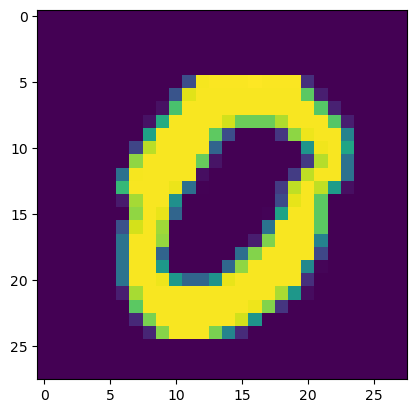

In [20]:
plt.imshow(X.iloc[sample_data.index.values[0],:].values.reshape(28,28))

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [22]:
X_train.shape

(56000, 784)

In [23]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier()

### __Applying KNN on all the `784` dimensions without performing any dimensionality reduction__

- Below code took 18s to run, i.e. amount of time taken by KNN to perform classification on 784 dimensions.

In [24]:
import time
start = time.time()
y_pred = knn.predict(X_test)
print(time.time() - start)

18.936986207962036


In [26]:
accuracy_score(y_test, y_pred)

0.9700714285714286

### __Performing PCA (without reducing components)__

In [27]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [28]:
# PCA with no specified components
pca = PCA(n_components=None)

In [29]:
X_train_1 = pca.fit_transform(X_train)
X_test_1 = pca.transform(X_test)

In [30]:
# Eigenvalues
pca.explained_variance_[:5]

array([40.6329685 , 29.01311301, 26.91849535, 20.8204608 , 18.1047848 ])

In [31]:
# Eigenvectors
pca.components_

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ...,
       [-0., -0., -0., ..., -0., -0., -0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [-0., -0., -0., ..., -0., -0., -0.]])

In [32]:
X_train_1.shape

(56000, 784)

In [33]:
knn = KNeighborsClassifier()
knn.fit(X_train_1, y_train)

KNeighborsClassifier()

In [34]:
start = time.time()
y_pred = knn.predict(X_test_1)
print(time.time() - start)

6.68472695350647


In [35]:
accuracy_score(y_test,y_pred)

0.9457857142857143

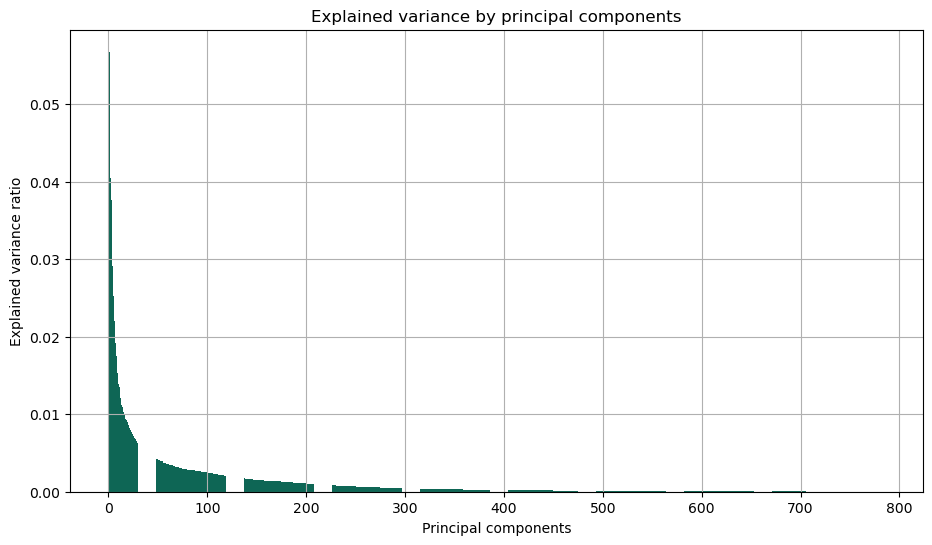

In [36]:
# Creating a bar chart to check the variance carried by each principal component

plt.figure(figsize=(11,6))
var_exp = pca.explained_variance_ratio_
plt.bar(range(1, len(pca.explained_variance_ratio_) + 1), var_exp, color='#0e6655')
plt.title('Explained variance by principal components')
plt.xlabel('Principal components')
plt.ylabel('Explained variance ratio')
plt.grid(True)
plt.show()

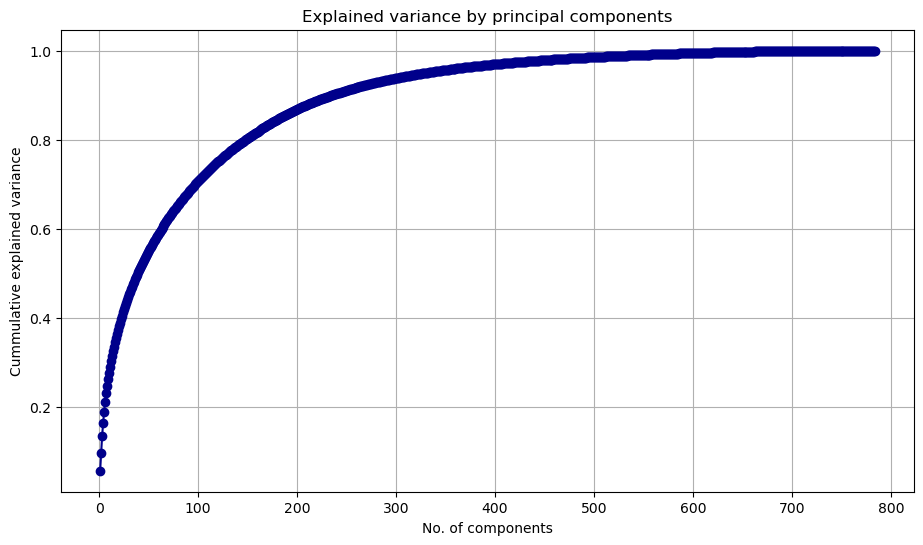

In [37]:
# Create a chart to check the cummulative variance of the PCs

plt.figure(figsize=(11,6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_.cumsum(), color='darkblue', marker='o')
plt.title('Explained variance by principal components')
plt.xlabel('No. of components')
plt.ylabel('Cummulative explained variance')
plt.grid(True)
plt.show()

### __Performing PCA with reduced components (`from 784 to 400`)__

In [38]:
# PCA with 400 components
pca = PCA(n_components=400)

In [39]:
X_train_400 = pca.fit_transform(X_train)
X_test_400 = pca.transform(X_test)

In [40]:
X_train_400.shape

(56000, 400)

In [41]:
knn = KNeighborsClassifier()
knn.fit(X_train_400,y_train)

KNeighborsClassifier()

In [42]:
start = time.time()
y_pred_400 = knn.predict(X_test_400)
print(time.time() - start)

3.2509727478027344


In [43]:
accuracy_score(y_test, y_pred_400)

0.9467142857142857

### __Performing PCA with reduced components (`from 784 to 200`)__

In [44]:
# PCA with 200 components
pca = PCA(n_components=200)

In [45]:
X_train_200 = pca.fit_transform(X_train)
X_test_200 = pca.transform(X_test)

In [46]:
X_train_200.shape

(56000, 200)

In [47]:
knn = KNeighborsClassifier()
knn.fit(X_train_200,y_train)

KNeighborsClassifier()

In [48]:
start = time.time()
y_pred_200 = knn.predict(X_test_200)
print(time.time() - start)

1.8004260063171387


In [49]:
accuracy_score(y_test, y_pred_200)

0.9550714285714286

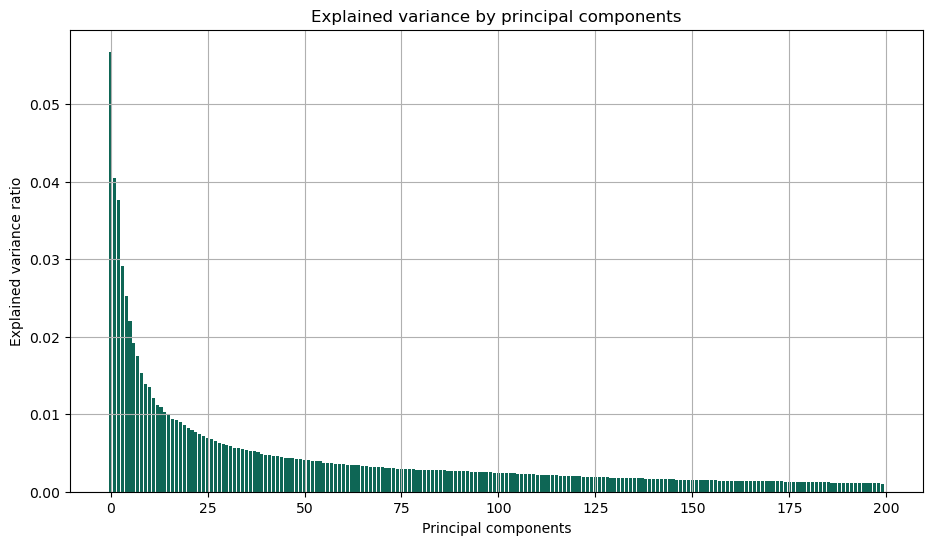

In [50]:
# Creating a bar chart to check the variance carried by each principal component

plt.figure(figsize=(11,6))
var_exp = pca.explained_variance_ratio_
plt.bar(list(range(len(pca.explained_variance_ratio_))), var_exp, color='#0e6655')
plt.title('Explained variance by principal components')
plt.xlabel('Principal components')
plt.ylabel('Explained variance ratio')
plt.grid(True)
plt.show()

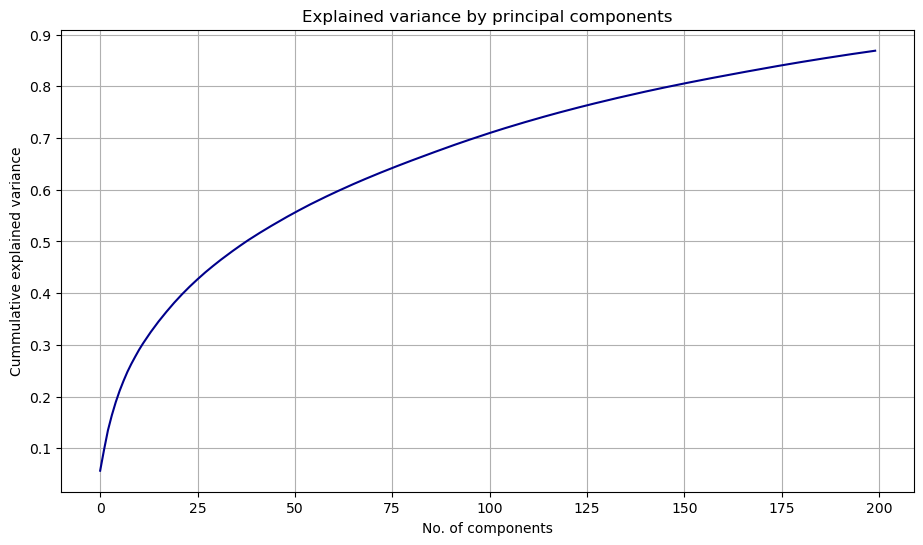

In [51]:
# Create a chart to check the cummulative variance of the PCs

plt.figure(figsize=(11,6))
plt.plot(list(range(len(pca.explained_variance_ratio_))), pca.explained_variance_ratio_.cumsum(), color='darkblue')
plt.title('Explained variance by principal components')
plt.xlabel('No. of components')
plt.ylabel('Cummulative explained variance')
plt.grid(True)
plt.show()

### __Performing PCA with 2 components (2D system)__

In [52]:
# Transforming the dimensions to a 2D coordinate system
pca = PCA(n_components=2)
X_train_2 = pca.fit_transform(X_train)
X_test_2 = pca.transform(X_test)

In [53]:
X_train_2.shape

(56000, 2)

In [54]:
knn = KNeighborsClassifier()
knn.fit(X_train_2,y_train)

KNeighborsClassifier()

In [55]:
y_pred_2 = knn.predict(X_test_2)
accuracy_score(y_test,y_pred_2)

0.32107142857142856

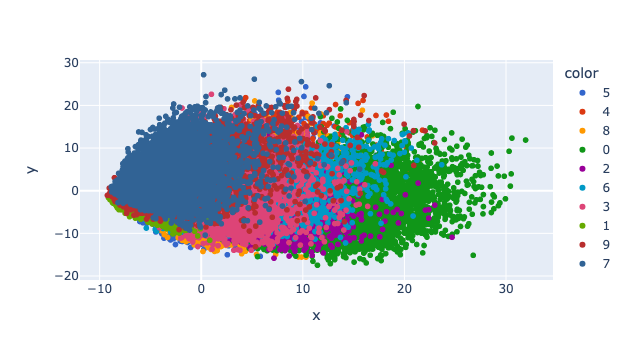

<Figure size 1100x800 with 0 Axes>

In [70]:
y_train_2 = y_train.astype(str)
plt.figure(figsize=(11,8))
fig = px.scatter(x=X_train_2[:,0],
                 y=X_train_2[:,1],
                 color=y_train_2,
                 color_discrete_sequence=px.colors.qualitative.G10
                )

fig.show()

### __Performing PCA with 3 components (3D system)__

In [58]:
# transforming in 3D
pca = PCA(n_components=3)
X_train_3 = pca.fit_transform(X_train)
X_test_3 = pca.transform(X_test)

In [59]:
X_train_3.shape

(56000, 3)

In [60]:
knn = KNeighborsClassifier()
knn.fit(X_train_3,y_train)

KNeighborsClassifier()

In [61]:
y_pred_3 = knn.predict(X_test_3)
accuracy_score(y_test,y_pred_3)

0.5111428571428571

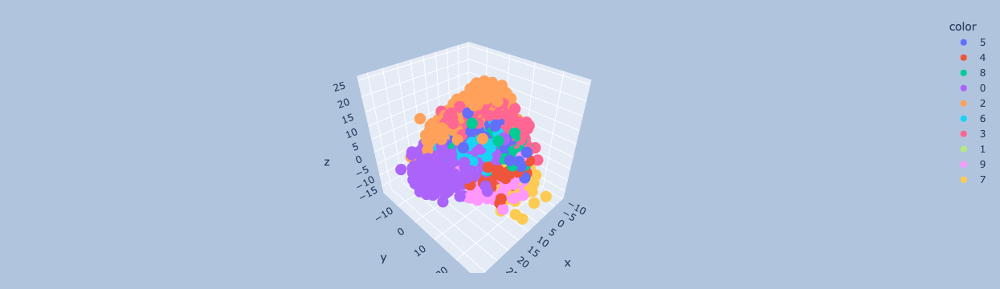

<Figure size 1100x800 with 0 Axes>

In [63]:
y_train_3 = y_train.astype(str)
plt.figure(figsize=(11,8))
fig = px.scatter_3d(x=X_train_3[:,0], 
                    y=X_train_3[:,1], 
                    z=X_train_3[:,2],
                    color=y_train_3
                   )
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [ ]:
# LDA

In [240]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
lda = LDA(n_components=2)
X_train_lda = lda.fit_transform(X_train, y_train)
X_test_lda = lda.transform(X_test)

In [241]:
lda.explained_variance_ratio_

array([0.23801142, 0.20214164])

In [242]:
X_train_lda.shape

(56000, 2)

In [243]:
X_train_lda[:,0].shape

(56000,)

In [244]:
X_train_lda[:1]

array([[-1.19377185, -0.37524327]])

ValueError: 'c' argument must be a color, a sequence of colors, or a sequence of numbers, not 47339    5
67456    4
12308    8
32557    0
664      2
        ..
37194    6
6265     6
54886    1
860      0
15795    0
Name: class, Length: 56000, dtype: category
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

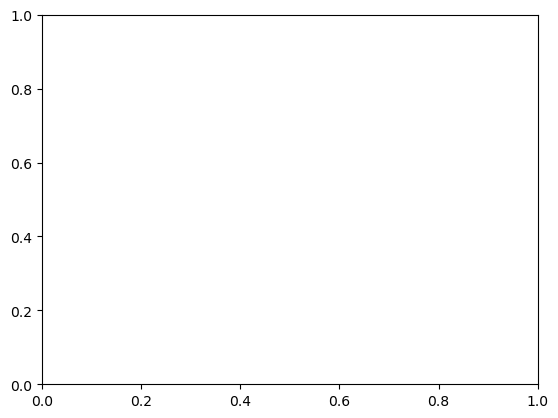

In [245]:
plt.scatter(X_train_lda[:,0],X_train_lda[:,1],c = y_train)